In [1]:
import os
import torch
import torchvision
import dataloaders
import random
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torch.nn.functional as F
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
from PIL import Image
import glob
from torchsummary import summary

In [2]:
seed = 0
random.seed(seed)
torch.manual_seed(seed)

DATA_PATH = "data/tmdb-64"
TABLE_PATH = "data/tmdb-movies-220915-clean.pkl"
workers = torch.get_num_threads()
batch_size = 64
image_size = 64
number_of_channels = 3
noise_vector_size = 100
generator_feature_maps = 64
discriminator_feature_maps = 64
num_epochs = 20
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.999
ngpu = 1
number_of_samples = 64
PADDING_MODE = "reflect"

colormode="RGB"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
model_to_load = "dcgan-output/2022-09-21_17-13-14/gan_at_epoch_0014.pt"

In [4]:
class DCGenerator(nn.Module):
    def __init__(self, ngpu):
        super(DCGenerator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_vector_size, generator_feature_maps * 8, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 8, generator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 4, generator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 2, generator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps, number_of_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [5]:
dcgenerator_network = DCGenerator(ngpu).to(device)

In [6]:
dcgenerator_network.load_state_dict(torch.load(model_to_load)['generator_model_state_dict'])

<All keys matched successfully>

In [7]:
dcgenerator_network.eval()

DCGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )


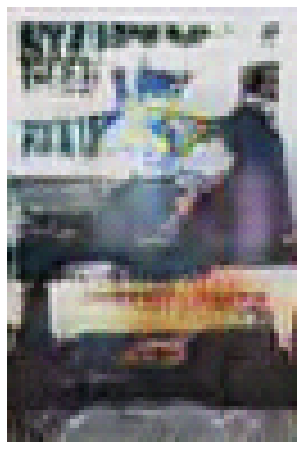

In [8]:
seed = 13
random.seed(seed)
torch.manual_seed(seed)
noise = torch.randn(1, noise_vector_size, 3, 1, device=device)
with torch.no_grad():
    images = dcgenerator_network(noise).detach().cpu()
img = vutils.make_grid(images, padding=2, normalize=True)
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(np.transpose(img,(1,2,0)))
plt.show()
fig.savefig("" + "image.png")

In [3]:
label_vector_size = 37
model_to_load = "cdcgan-output/2022-09-24_15-41-54/gan_at_epoch_0014.pt"
generator_feature_maps = 128

In [4]:
class CDCGenerator(nn.Module):
    def __init__(self):
        super(CDCGenerator, self).__init__()
        self.deconv1_image = nn.ConvTranspose2d(noise_vector_size, generator_feature_maps * 4, kernel_size=(4, 4), stride=(1, 1), bias=False)
        self.deconv1_image_bn = nn.BatchNorm2d(generator_feature_maps * 4)
        self.deconv1_label = nn.ConvTranspose2d(label_vector_size, generator_feature_maps * 4, kernel_size=(4, 4), stride=(1, 1), bias=False)
        self.deconv1_label_bn = nn.BatchNorm2d(generator_feature_maps * 4)

        self.deconv2 = nn.ConvTranspose2d(generator_feature_maps * 8, generator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        self.deconv2_bn = nn.BatchNorm2d(generator_feature_maps * 4)

        self.deconv3 =  nn.ConvTranspose2d(generator_feature_maps * 4, generator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        self.deconv3_bn = nn.BatchNorm2d(generator_feature_maps * 2)

        self.deconv4 =  nn.ConvTranspose2d(generator_feature_maps * 2, generator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        self.deconv4_bn = nn.BatchNorm2d(generator_feature_maps)

        self.deconv5 =  nn.ConvTranspose2d(generator_feature_maps, number_of_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)

    def forward(self, input, label):
        x = F.relu(self.deconv1_image_bn(self.deconv1_image(input)))
        y = F.relu(self.deconv1_label_bn(self.deconv1_label(label)))
        x = torch.cat([x, y], 1)
        x = F.relu(self.deconv2_bn(self.deconv2(x)))
        x = F.relu(self.deconv3_bn(self.deconv3(x)))
        x = F.relu(self.deconv4_bn(self.deconv4(x)))
        return torch.tanh(self.deconv5(x))

In [5]:
cdcgenerator_network = CDCGenerator().to(device)

In [6]:
cdcgenerator_network.load_state_dict(torch.load(model_to_load)['generator_model_state_dict'])

<All keys matched successfully>

In [8]:
cdcgenerator_network.eval()

CDCGenerator(
  (deconv1_image): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (deconv1_image_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv1_label): ConvTranspose2d(37, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (deconv1_label_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (deconv2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (deconv3_bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (deconv4_bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

In [69]:
number_of_samples = 4
features = {"is_thriller": 0, "is_horror": 0, "is_animation": 1, "is_scifi": 0,
            "is_action": 0, "is_drama": 0, "is_fantasy": 0, "is_adventure": 0,
            "is_family": 0, "is_comedy": 0, "is_tv": 0, "is_crime": 0,
            "is_mystery": 0, "is_war": 0, "is_romance": 0, "is_music": 0,
            "is_history": 0, "is_docu": 0, "is_western": 0, "lang_ar": 0,
            "lang_cn": 0, "lang_de": 0, "lang_el": 0, "lang_en": 0,
            "lang_es": 0, "lang_fr": 0, "lang_hi": 0, "lang_it": 0,
            "lang_ja": 1, "lant_ko": 0, "lang_other": 0, "lang_pt": 0,
            "lang_ru": 0, "lang_sv": 0, "lang_tl": 0, "lang_tr": 0, "lang_zh": 0}

feature_vectors = [torch.ones(number_of_samples) * is_on for is_on in features.values()]
feature_vectors = torch.stack(feature_vectors, 1)
feature_vectors_generator = feature_vectors[:, :, None, None].expand(number_of_samples, label_vector_size, 3, 1).to(device)

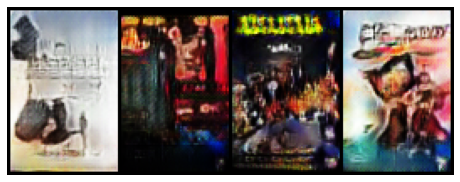

In [70]:
seed = 666
random.seed(seed)
torch.manual_seed(seed)
noise = torch.randn(number_of_samples, noise_vector_size, 3, 1, device=device)
with torch.no_grad():
    images = cdcgenerator_network(noise, feature_vectors_generator).detach().cpu()
img = vutils.make_grid(images, padding=2, normalize=True)
fig = plt.figure(figsize=(8, 8))
plt.axis("off")
plt.imshow(np.transpose(img,(1,2,0)))
plt.show()
fig.savefig("" + "image2.png")

In [17]:
number_of_samples = 1
genres = {"is_thriller": 0, "is_horror": 0, "is_animation": 0, "is_scifi": 0,
            "is_action": 0, "is_drama": 0, "is_fantasy": 0, "is_adventure": 0,
            "is_family": 0, "is_comedy": 0, "is_tv": 0, "is_crime": 0,
            "is_mystery": 0, "is_war": 0, "is_romance": 0, "is_music": 0,
            "is_history": 0, "is_docu": 0, "is_western": 0}
languages = {"lang_ar": 0, "lang_cn": 0, "lang_de": 0, "lang_el": 0,
             "lang_en": 0, "lang_es": 0, "lang_fr": 0, "lang_hi": 0,
             "lang_it": 0, "lang_ja": 0, "lant_ko": 0, "lang_other": 0,
             "lang_pt": 0, "lang_ru": 0, "lang_sv": 0, "lang_tl": 0,
             "lang_tr": 0, "lang_zh": 0}

samples = []
for genre in genres:
    current_genres = genres.copy()
    current_genres[genre] = 1
    for language in languages:
        current_languages = languages.copy()
        current_languages[language] = 1
        features = current_genres | current_languages
        feature_vectors = [torch.ones(number_of_samples) * is_on for is_on in features.values()]
        feature_vectors = torch.stack(feature_vectors, 1)
        samples.append(feature_vectors[:, :, None, None].expand(number_of_samples, label_vector_size, 3, 1).to(device))

samples = torch.reshape(torch.stack(samples, dim=1), (len(genres) * len(languages), len(genres) + len(languages), 3, 1))

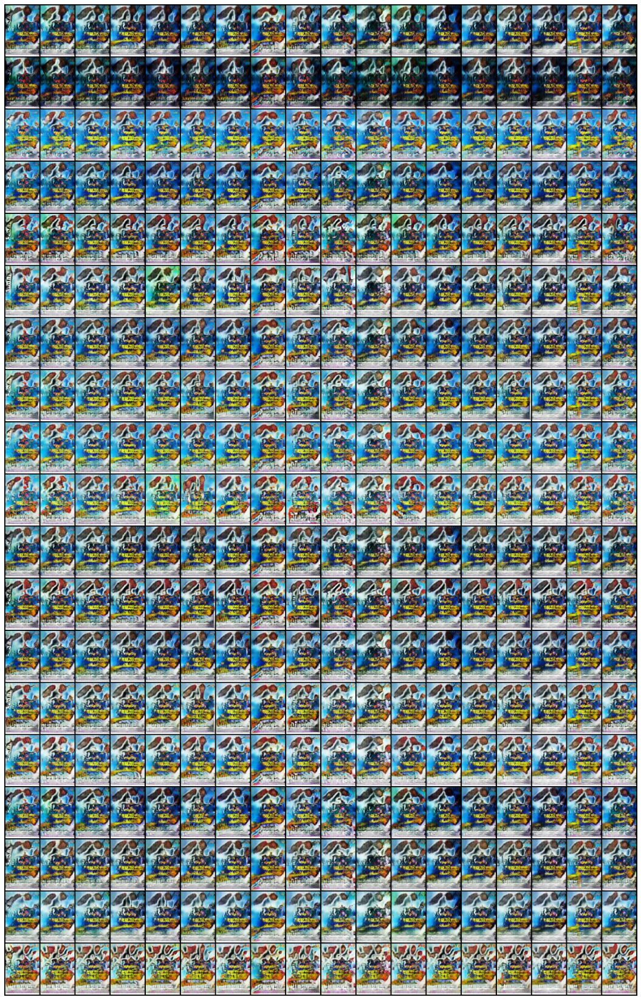

In [41]:
seed = 79469812346923649
random.seed(seed)
torch.manual_seed(seed)
noise = torch.randn(1, noise_vector_size, 3, 1, device=device)
noise = noise.expand(len(genres) * len(languages),noise_vector_size, 3, 1).to(device)
with torch.no_grad():
    images = cdcgenerator_network(noise, samples).detach().cpu()
img = vutils.make_grid(images, nrow=len(languages), padding=2, normalize=True)
fig = plt.figure(figsize=(20, 30))
plt.axis("off")
plt.imshow(np.transpose(img,(1,2,0)))
plt.show()
fig.savefig("" + "image.png")

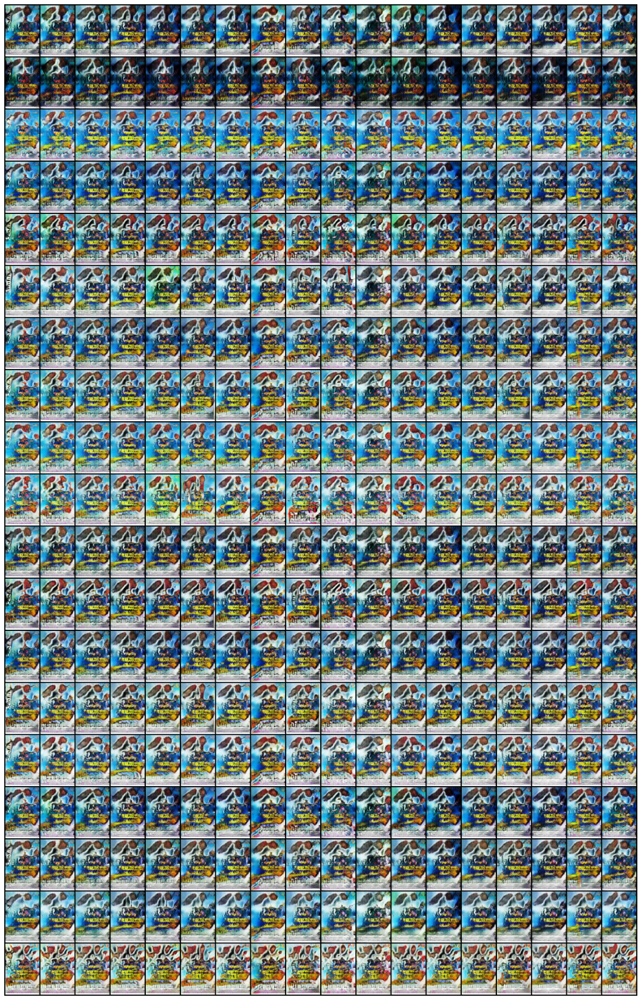

In [42]:
from networks.utils import plot_grid
seed = 79469812346923649
plot_grid(cdcgenerator_network, noise_vector_size, device, seed)